# Appendix

In [6]:
# Helper libraries
import datetime
import time
import pydot_ng as pydot
from packaging import version
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler

from collections import Counter
import numpy as np
import pandas as pd

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.datasets import mnist
from plot_keras_history import plot_history

In [7]:
%matplotlib inline
np.set_printoptions(precision=3, suppress=True)

In [8]:
print("This notebook requires TensorFlow 2.0 or above")
print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >=2

This notebook requires TensorFlow 2.0 or above
TensorFlow version:  2.0.0


In [9]:
print("Keras version: ", keras.__version__)

Keras version:  2.2.4-tf


In [10]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [11]:
(x_train, y_train), (x_test, y_test)= tf.keras.datasets.mnist.load_data()

In [12]:
print('x_train:\t{}'.format(x_train.shape))
print('y_train:\t{}'.format(y_train.shape))
print('x_test:\t\t{}'.format(x_test.shape))
print('y_test:\t\t{}'.format(y_test.shape))

x_train:	(60000, 28, 28)
y_train:	(60000,)
x_test:		(10000, 28, 28)
y_test:		(10000,)


In [13]:
print("First ten labels training dataset:\n {}\n".format(y_train[0:10]))

First ten labels training dataset:
 [5 0 4 1 9 2 1 3 1 4]



In [437]:
x_train

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [14]:
Counter(y_train).most_common()

[(1, 6742),
 (7, 6265),
 (3, 6131),
 (2, 5958),
 (9, 5949),
 (0, 5923),
 (6, 5918),
 (8, 5851),
 (4, 5842),
 (5, 5421)]

In [15]:
Counter(y_test).most_common()


[(1, 1135),
 (2, 1032),
 (7, 1028),
 (3, 1010),
 (9, 1009),
 (4, 982),
 (0, 980),
 (8, 974),
 (6, 958),
 (5, 892)]

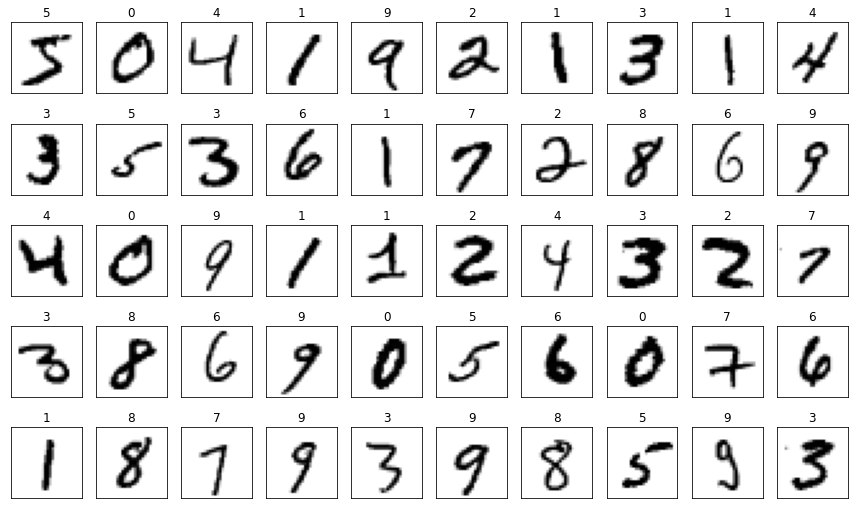

In [16]:
fig = plt.figure(figsize = (15, 9))

for i in range(50):
    plt.subplot(5, 10, 1+i)
    plt.title(y_train[i])
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x_train[i].reshape(28,28), cmap='binary')

In [17]:

y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)

print("First ten entries of y_train:\n {}\n".format(y_train[0:10]))
print("First ten rows of one-hot y_train:\n {}".format(y_train_encoded[0:10,]))

First ten entries of y_train:
 [5 0 4 1 9 2 1 3 1 4]

First ten rows of one-hot y_train:
 [[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


In [18]:
print('y_train_encoded shape: ', y_train_encoded.shape)
print('y_test_encoded shape: ', y_test_encoded.shape)

y_train_encoded shape:  (60000, 10)
y_test_encoded shape:  (10000, 10)


In [19]:
print('x_train:\t{}'.format(x_train.shape))
print('x_test:\t\t{}'.format(x_test.shape))

x_train:	(60000, 28, 28)
x_test:		(10000, 28, 28)


In [20]:
x_train_reshaped = np.reshape(x_train, (60000, 784))
x_test_reshaped = np.reshape(x_test, (10000, 784))

print('x_train_reshaped shape: ', x_train_reshaped.shape)
print('x_test_reshaped shape: ', x_test_reshaped.shape)

x_train_reshaped shape:  (60000, 784)
x_test_reshaped shape:  (10000, 784)


In [21]:
print(set(x_train_reshaped[0]))

{0, 1, 2, 3, 9, 11, 14, 16, 18, 23, 24, 25, 26, 27, 30, 35, 36, 39, 43, 45, 46, 49, 55, 56, 64, 66, 70, 78, 80, 81, 82, 90, 93, 94, 107, 108, 114, 119, 126, 127, 130, 132, 133, 135, 136, 139, 148, 150, 154, 156, 160, 166, 170, 171, 172, 175, 182, 183, 186, 187, 190, 195, 198, 201, 205, 207, 212, 213, 219, 221, 225, 226, 229, 238, 240, 241, 242, 244, 247, 249, 250, 251, 252, 253, 255}


In [22]:
np.set_printoptions(linewidth=np.inf)
print("{}".format(x_train[2020]))

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0 167 208  19   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  13 235 254  99   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  74 254 234   4   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0 154 254 145   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0 224 254  92   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  51 245 211  13   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   2 169 254 101   0   0   0   0   0   

In [23]:
x_train_norm = x_train_reshaped.astype('float32') / 255
x_test_norm = x_test_reshaped.astype('float32') / 255

In [24]:
print(set(x_train_norm[0]))

{0.0, 0.011764706, 0.53333336, 0.07058824, 0.49411765, 0.6862745, 0.101960786, 0.6509804, 1.0, 0.96862745, 0.49803922, 0.11764706, 0.14117648, 0.36862746, 0.6039216, 0.6666667, 0.043137256, 0.05490196, 0.03529412, 0.85882354, 0.7764706, 0.7137255, 0.94509804, 0.3137255, 0.6117647, 0.41960785, 0.25882354, 0.32156864, 0.21960784, 0.8039216, 0.8666667, 0.8980392, 0.7882353, 0.52156866, 0.18039216, 0.30588236, 0.44705883, 0.3529412, 0.15294118, 0.6745098, 0.88235295, 0.99215686, 0.9490196, 0.7647059, 0.2509804, 0.19215687, 0.93333334, 0.9843137, 0.74509805, 0.7294118, 0.5882353, 0.50980395, 0.8862745, 0.105882354, 0.09019608, 0.16862746, 0.13725491, 0.21568628, 0.46666667, 0.3647059, 0.27450982, 0.8352941, 0.7176471, 0.5803922, 0.8117647, 0.9764706, 0.98039216, 0.73333335, 0.42352942, 0.003921569, 0.54509807, 0.67058825, 0.5294118, 0.007843138, 0.31764707, 0.0627451, 0.09411765, 0.627451, 0.9411765, 0.9882353, 0.95686275, 0.83137256, 0.5176471, 0.09803922, 0.1764706}


# MODEL 1

In [511]:
model = Sequential([
    Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])



In [512]:
model.summary()

Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 128)               100480    
_________________________________________________________________
output_layer (Dense)         (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


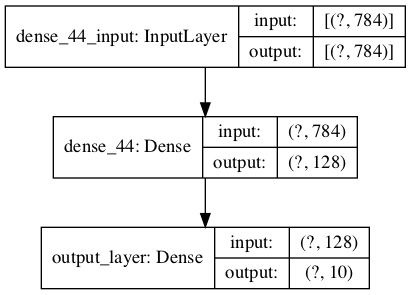

In [513]:
keras.utils.plot_model(model, "mnist_model.png", show_shapes=True)


In [514]:
model.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])


In [515]:
t1 = time.time()
historytrain = model.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time1 = time.time() - t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 10s 218us/sample - loss: 0.2892 - accuracy: 0.9170 - val_loss: 0.1606 - val_accuracy: 0.9530
Epoch 2/10
48000/48000 [==============================] - 9s 184us/sample - loss: 0.1366 - accuracy: 0.9594 - val_loss: 0.1278 - val_accuracy: 0.9608
Epoch 3/10
48000/48000 [==============================] - 10s 204us/sample - loss: 0.0994 - accuracy: 0.9714 - val_loss: 0.1192 - val_accuracy: 0.9661
Epoch 4/10
48000/48000 [==============================] - 10s 205us/sample - loss: 0.0793 - accuracy: 0.9771 - val_loss: 0.0990 - val_accuracy: 0.9719
Epoch 5/10
48000/48000 [==============================] - 9s 179us/sample - loss: 0.0652 - accuracy: 0.9820 - val_loss: 0.1022 - val_accuracy: 0.9735
Epoch 6/10
48000/48000 [==============================] - 9s 180us/sample - loss: 0.0558 - accuracy: 0.9845 - val_loss: 0.1012 - val_accuracy: 0.9723
Epoch 7/10
48000/48000 [=======================

In [516]:
loss, accuracy = model.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.61999845504761


In [517]:
trainloss, trainaccuracy = model.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  99.00500178337097


In [518]:
preds = model.predict(x_test_norm)
print('shape of preds: ', preds.shape)

shape of preds:  (10000, 10)


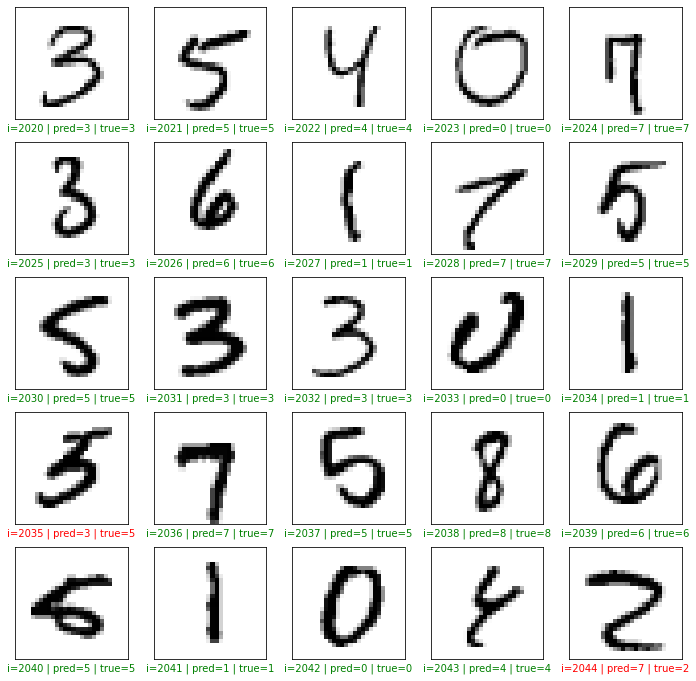

In [519]:
plt.figure(figsize = (12, 12))
start_index = 2020

for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    pred = np.argmax(preds[start_index + i])
    actual = np.argmax(y_test_encoded[start_index + i])
    col = 'g'
    if pred != actual:
        col = 'r'
    plt.xlabel('i={} | pred={} | true={}'.format(start_index + i, pred, actual), color = col)
    plt.imshow(x_test[start_index + i], cmap='binary')
plt.show()

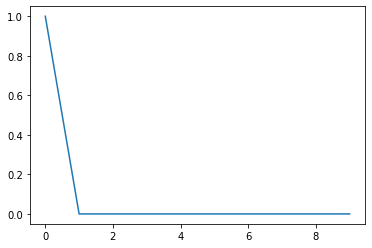

In [520]:
"""
Enter the index value in place of the value 17 below for the prediction
that you want to plot the probability scores for
"""
index = 2042

plt.plot(preds[index])
plt.show()

In [521]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [522]:
acctrain = historytrain.history['accuracy']
val_acctrain = historytrain.history['val_accuracy']
losstrain = historytrain.history['loss']
val_losstrain = historytrain.history['val_loss']

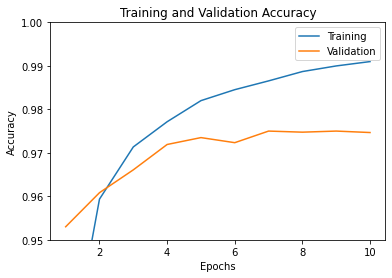

In [523]:
plt.plot(range(1, len(acctrain) + 1), historytrain.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acctrain) + 1), historytrain.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [524]:
# Get the predicted classes:
# pred_classes = model.predict_classes(x_train_norm)# give deprecation warning
pred_classes = np.argmax(model.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [525]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=2929343, shape=(10, 10), dtype=int32, numpy=
array([[ 971,    0,    1,    2,    1,    1,    1,    1,    2,    0],
       [   0, 1116,    4,    1,    0,    1,    2,    2,    9,    0],
       [   4,    2,  998,    8,    2,    0,    2,    7,    9,    0],
       [   0,    0,    4,  986,    0,    7,    0,    2,    7,    4],
       [   1,    0,    4,    1,  963,    0,    3,    3,    0,    7],
       [   2,    0,    0,    8,    1,  867,    7,    1,    5,    1],
       [   4,    1,    0,    1,    8,    2,  941,    0,    1,    0],
       [   1,    2,    7,    2,    1,    0,    0, 1007,    2,    6],
       [   3,    0,    4,    6,    5,    5,    5,    1,  941,    4],
       [   3,    3,    0,    8,    9,    4,    0,    6,    4,  972]], dtype=int32)>

In [526]:
def plot_confusion_matrix(matrix):
    """If you prefer color and a colorbar"""
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    cax = ax.matshow(matrix)
    fig.colorbar(cax)

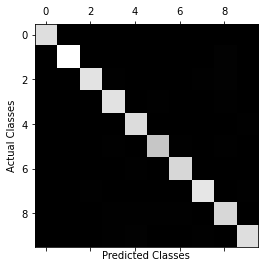

In [527]:
plt.matshow(conf_mx, cmap=plt.cm.gray)
plt.xlabel("Predicted Classes")
plt.ylabel("Actual Classes")
plt.show()

In [528]:

def plot_digits(instances, pos, images_per_row=5, **options):
    size = 28
    images_per_row = min(len(instances), images_per_row)
    images = [instance.reshape(size,size) for instance in instances]
    n_rows = (len(instances) - 1) // images_per_row + 1
    row_images = []
    n_empty = n_rows * images_per_row - len(instances)
    images.append(np.zeros((size, size * n_empty)))
    for row in range(n_rows):
        rimages = images[row * images_per_row : (row + 1) * images_per_row]
        row_images.append(np.concatenate(rimages, axis=1))
    image = np.concatenate(row_images, axis=0)
    pos.imshow(image, cmap = 'binary', **options)
    pos.axis("off")

In [529]:
cl_a, cl_b = 4, 9
X_aa = x_train_norm[(y_train == cl_a) & (pred_classes == cl_a)]
X_ab = x_train_norm[(y_train == cl_a) & (pred_classes == cl_b)]
X_ba = x_train_norm[(y_train == cl_b) & (pred_classes == cl_a)]
X_bb = x_train_norm[(y_train == cl_b) & (pred_classes == cl_b)]

plt.figure(figsize=(6,6))

p1 = plt.subplot(221)
p2 = plt.subplot(222)
p3 = plt.subplot(223)
p4 = plt.subplot(224)

plot_digits(X_aa[:25], p1, images_per_row=5);
plot_digits(X_ab[:25], p2, images_per_row=5);
plot_digits(X_ba[:25], p3, images_per_row=5);  
plot_digits(X_bb[:25], p4, images_per_row=5);


p1.set_title(f"{cl_a}'s classified as {cl_a}'s")
p2.set_title(f"{cl_a}'s classified as {cl_b}'s")
p3.set_title(f"{cl_b}'s classified as {cl_a}'s")
p4.set_title(f"{cl_b}'s classified as {cl_b}'s")

# plt.savefig("error_analysis_digits_plot_EXP1_valid")

plt.show()


ValueError: operands could not be broadcast together with shapes (60000,) (10000,) 

# MODEL 2

In [530]:
model2 = Sequential([
    Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
    Dense(name = "Hidden_Layer_1", units = 128, activation = tf.nn.relu ),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])



In [531]:
model2.summary()

Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_45 (Dense)             (None, 128)               100480    
_________________________________________________________________
Hidden_Layer_1 (Dense)       (None, 128)               16512     
_________________________________________________________________
output_layer (Dense)         (None, 10)                1290      
Total params: 118,282
Trainable params: 118,282
Non-trainable params: 0
_________________________________________________________________


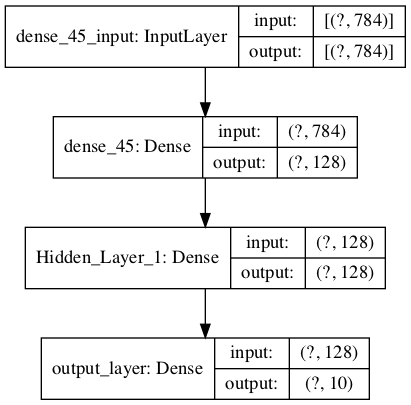

In [532]:
keras.utils.plot_model(model2, "mnist_model.png", show_shapes=True)

In [533]:
model2.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [534]:
t1 = time.time()
history2train = model2.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time2 = time.time() -t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 11s 222us/sample - loss: 0.2593 - accuracy: 0.9232 - val_loss: 0.1373 - val_accuracy: 0.9597
Epoch 2/10
48000/48000 [==============================] - 10s 213us/sample - loss: 0.1127 - accuracy: 0.9669 - val_loss: 0.1281 - val_accuracy: 0.9659
Epoch 3/10
48000/48000 [==============================] - 10s 206us/sample - loss: 0.0812 - accuracy: 0.9760 - val_loss: 0.1103 - val_accuracy: 0.9709
Epoch 4/10
48000/48000 [==============================] - 9s 196us/sample - loss: 0.0641 - accuracy: 0.9814 - val_loss: 0.1055 - val_accuracy: 0.9730
Epoch 5/10
48000/48000 [==============================] - 11s 228us/sample - loss: 0.0542 - accuracy: 0.9845 - val_loss: 0.1290 - val_accuracy: 0.9727
Epoch 6/10
48000/48000 [==============================] - 10s 216us/sample - loss: 0.0462 - accuracy: 0.9869 - val_loss: 0.1248 - val_accuracy: 0.9724
Epoch 7/10
48000/48000 [=====================

In [535]:
acctrain = history2train.history['accuracy']
val_acctrain = history2train.history['val_accuracy']
losstrain = history2train.history['loss']
val_losstrain = history2train.history['val_loss']

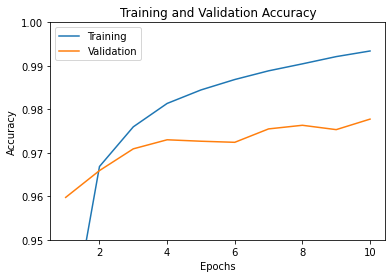

In [536]:
plt.plot(range(1, len(acctrain) + 1), history2train.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acc) + 1), history2train.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [537]:
pred_classes = np.argmax(model2.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [538]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=2987067, shape=(10, 10), dtype=int32, numpy=
array([[ 971,    2,    0,    1,    1,    0,    3,    1,    1,    0],
       [   0, 1127,    2,    1,    0,    0,    2,    1,    2,    0],
       [   3,    1, 1014,    2,    1,    0,    3,    4,    4,    0],
       [   0,    0,    6,  985,    0,   10,    0,    4,    3,    2],
       [   0,    2,    5,    1,  956,    0,    3,    1,    0,   14],
       [   2,    0,    0,   12,    1,  866,    4,    1,    3,    3],
       [   3,    2,    1,    1,    2,    4,  943,    0,    2,    0],
       [   0,    4,   11,    1,    1,    0,    0, 1004,    0,    7],
       [   2,    1,    5,    4,    2,    2,    1,    5,  947,    5],
       [   2,    3,    0,    8,    5,    2,    0,    8,    3,  978]], dtype=int32)>

In [539]:
loss2, accuracy2 = model2.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy2 * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.9099988937378


In [540]:
trainloss2, trainaccuracy2 = model2.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy2 * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  99.32166934013367


# MODEL 3

In [541]:
model3 = Sequential([
    Dense(input_shape=[784], units = 64, activation = tf.nn.relu),
    Dense(name = "Hidden_Layer_1", units = 64, activation = tf.nn.relu ),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])


In [542]:
model3.summary()

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_46 (Dense)             (None, 64)                50240     
_________________________________________________________________
Hidden_Layer_1 (Dense)       (None, 64)                4160      
_________________________________________________________________
output_layer (Dense)         (None, 10)                650       
Total params: 55,050
Trainable params: 55,050
Non-trainable params: 0
_________________________________________________________________


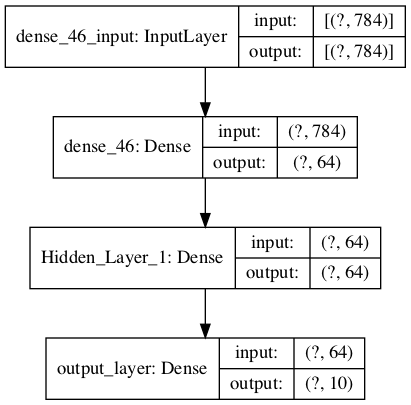

In [543]:
keras.utils.plot_model(model3, "mnist_model.png", show_shapes=True)

In [544]:
model3.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [545]:
t1 = time.time()
history3train = model3.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time3 = time.time() - t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 10s 203us/sample - loss: 0.3079 - accuracy: 0.9113 - val_loss: 0.1837 - val_accuracy: 0.9462
Epoch 2/10
48000/48000 [==============================] - 9s 188us/sample - loss: 0.1419 - accuracy: 0.9576 - val_loss: 0.1213 - val_accuracy: 0.9643
Epoch 3/10
48000/48000 [==============================] - 9s 181us/sample - loss: 0.1049 - accuracy: 0.9688 - val_loss: 0.1277 - val_accuracy: 0.9648
Epoch 4/10
48000/48000 [==============================] - 8s 164us/sample - loss: 0.0854 - accuracy: 0.9751 - val_loss: 0.1146 - val_accuracy: 0.9688
Epoch 5/10
48000/48000 [==============================] - 8s 157us/sample - loss: 0.0729 - accuracy: 0.9785 - val_loss: 0.1195 - val_accuracy: 0.9703
Epoch 6/10
48000/48000 [==============================] - 8s 158us/sample - loss: 0.0628 - accuracy: 0.9816 - val_loss: 0.1163 - val_accuracy: 0.9703
Epoch 7/10
48000/48000 [=========================

In [546]:
acctrain = history3train.history['accuracy']
val_acctrain = history3train.history['val_accuracy']
losstrain = history3train.history['loss']
val_losstrain = history3train.history['val_loss']


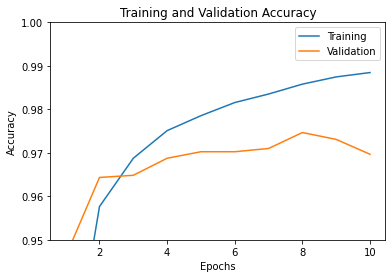

In [547]:
plt.plot(range(1, len(acctrain) + 1), history3train.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acctrain) + 1), history3train.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [548]:
loss3, accuracy3 = model3.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy3 * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.36999869346619


In [549]:
trainloss3, trainaccuracy3 = model3.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy3 * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  98.5783338546753


In [550]:
pred_classes = np.argmax(model3.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [551]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=3058363, shape=(10, 10), dtype=int32, numpy=
array([[ 957,    0,    2,    1,    0,   12,    4,    1,    1,    2],
       [   0, 1124,    2,    1,    0,    0,    2,    1,    5,    0],
       [   1,    2, 1003,    7,    0,    1,    3,    2,   11,    2],
       [   0,    1,    3,  982,    0,   17,    0,    3,    4,    0],
       [   1,    2,    3,    1,  949,    0,    6,    1,    2,   17],
       [   2,    0,    0,    3,    0,  878,    2,    0,    5,    2],
       [   2,    3,    1,    0,    5,   15,  931,    0,    1,    0],
       [   0,    6,   12,    6,    1,    2,    0,  981,    2,   18],
       [   0,    0,    3,    3,    1,    7,    1,    2,  953,    4],
       [   0,    2,    0,    8,    7,    7,    1,    3,    2,  979]], dtype=int32)>

# Model 4

In [552]:
model4 = Sequential([
    Dense(input_shape=[784], units = 64, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])


In [553]:
model4.summary()

Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_47 (Dense)             (None, 64)                50240     
_________________________________________________________________
output_layer (Dense)         (None, 10)                650       
Total params: 50,890
Trainable params: 50,890
Non-trainable params: 0
_________________________________________________________________


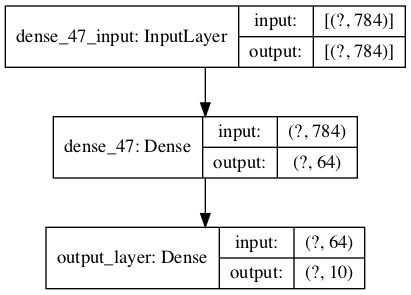

In [554]:
keras.utils.plot_model(model4, "mnist_model.png", show_shapes=True)

In [555]:
model4.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [556]:
t1 = time.time()
history4train = model4.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time4 = time.time() - t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 8s 172us/sample - loss: 0.3158 - accuracy: 0.9111 - val_loss: 0.1727 - val_accuracy: 0.9507
Epoch 2/10
48000/48000 [==============================] - 8s 163us/sample - loss: 0.1571 - accuracy: 0.9540 - val_loss: 0.1413 - val_accuracy: 0.9595
Epoch 3/10
48000/48000 [==============================] - 8s 169us/sample - loss: 0.1185 - accuracy: 0.9657 - val_loss: 0.1227 - val_accuracy: 0.9653
Epoch 4/10
48000/48000 [==============================] - 7s 150us/sample - loss: 0.0974 - accuracy: 0.9715 - val_loss: 0.1173 - val_accuracy: 0.9662
Epoch 5/10
48000/48000 [==============================] - 8s 160us/sample - loss: 0.0836 - accuracy: 0.9759 - val_loss: 0.1057 - val_accuracy: 0.9699
Epoch 6/10
48000/48000 [==============================] - 7s 156us/sample - loss: 0.0737 - accuracy: 0.9791 - val_loss: 0.1174 - val_accuracy: 0.9679
Epoch 7/10
48000/48000 [==========================

In [557]:
acctrain = history4train.history['accuracy']
val_acc = history4train.history['val_accuracy']
loss = history4train.history['loss']
val_loss = history4train.history['val_loss']

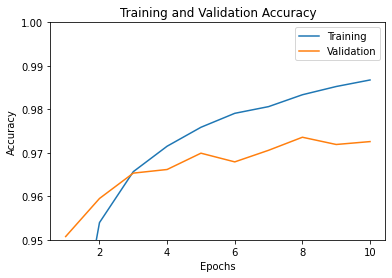

In [558]:
plt.plot(range(1, len(acctrain) + 1), history4train.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acctrain) + 1), history4train.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [559]:
loss4, accuracy4 = model4.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy4 * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.2599983215332


In [560]:
trainloss4, trainaccuracy4 = model4.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy4 * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  98.57666492462158


In [561]:
pred_classes = np.argmax(model4.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [562]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=3122722, shape=(10, 10), dtype=int32, numpy=
array([[ 970,    0,    1,    0,    1,    2,    4,    1,    1,    0],
       [   0, 1119,    3,    1,    0,    1,    5,    0,    6,    0],
       [   6,    1,  989,    9,    3,    0,    4,    7,   13,    0],
       [   1,    0,    2,  987,    0,    6,    0,    8,    6,    0],
       [   2,    0,    4,    0,  972,    0,    1,    0,    1,    2],
       [   5,    1,    0,    8,    3,  854,   11,    0,    7,    3],
       [   4,    2,    0,    0,    5,    6,  939,    0,    2,    0],
       [   1,    2,    6,    8,    4,    0,    0,  996,    3,    8],
       [   6,    0,    4,    7,    8,    3,    4,    2,  937,    3],
       [   3,    3,    1,    7,   19,    3,    1,    4,    5,  963]], dtype=int32)>

# MODEL 5

In [563]:
model5 = Sequential([
    Dense(input_shape=[784], units = 256, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])



In [564]:
model5.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [565]:
t1 = time.time()
history5train = model5.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time5 = time.time() - t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 13s 262us/sample - loss: 0.2509 - accuracy: 0.9263 - val_loss: 0.1366 - val_accuracy: 0.9592
Epoch 2/10
48000/48000 [==============================] - 11s 221us/sample - loss: 0.1111 - accuracy: 0.9673 - val_loss: 0.1044 - val_accuracy: 0.9681
Epoch 3/10
48000/48000 [==============================] - 11s 235us/sample - loss: 0.0774 - accuracy: 0.9776 - val_loss: 0.0962 - val_accuracy: 0.9737
Epoch 4/10
48000/48000 [==============================] - 13s 267us/sample - loss: 0.0605 - accuracy: 0.9826 - val_loss: 0.0962 - val_accuracy: 0.9758
Epoch 5/10
48000/48000 [==============================] - 13s 273us/sample - loss: 0.0478 - accuracy: 0.9862 - val_loss: 0.1078 - val_accuracy: 0.9747
Epoch 6/10
48000/48000 [==============================] - 11s 235us/sample - loss: 0.0400 - accuracy: 0.9886 - val_loss: 0.1126 - val_accuracy: 0.9738
Epoch 7/10
48000/48000 [====================

In [566]:
acctrain = history5train.history['accuracy']
val_acctrain = history5train.history['val_accuracy']
losstrain = history5train.history['loss']
val_losstrain = history5train.history['val_loss']


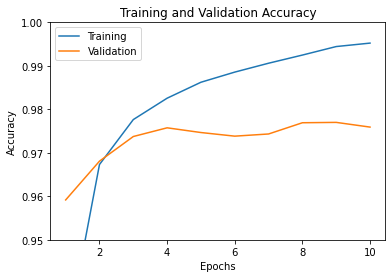

In [567]:
plt.plot(range(1, len(acctrain) + 1), history5train.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acctrain) + 1), history5train.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [568]:
loss5, accuracy5 = model5.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy5 * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.83999919891357


In [569]:
trainloss5, trainaccuracy5 = model5.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy5 * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  99.26999807357788


In [570]:
pred_classes = np.argmax(model5.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [571]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=3187081, shape=(10, 10), dtype=int32, numpy=
array([[ 970,    0,    1,    0,    2,    1,    3,    1,    2,    0],
       [   0, 1124,    3,    1,    0,    1,    2,    2,    2,    0],
       [   4,    2, 1004,    2,    3,    0,    2,    7,    8,    0],
       [   0,    0,    2,  997,    0,    2,    0,    4,    2,    3],
       [   0,    0,    2,    1,  970,    0,    4,    1,    0,    4],
       [   3,    0,    0,   18,    1,  859,    5,    0,    3,    3],
       [   3,    2,    0,    1,    8,    7,  935,    0,    2,    0],
       [   0,    3,   11,    3,    7,    0,    0,  996,    3,    5],
       [   1,    0,    6,    5,    7,    3,    1,    2,  944,    5],
       [   1,    2,    0,    4,   13,    2,    0,    1,    1,  985]], dtype=int32)>

# MODEL 6

In [572]:
model6 = Sequential([
    Dense(input_shape=[784], units = 256, activation = tf.nn.relu),
    Dense(name = "Hidden_Layer_1", units = 256, activation = tf.nn.relu ),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])


In [573]:
model6.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [574]:
t1 = time.time()
history6 = model6.fit(
    x_train_norm,
    y_train_encoded,
    epochs = 10,
    validation_split=0.20 
    )
time6 = time.time() - t1

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
48000/48000 [==============================] - 17s 356us/sample - loss: 0.2180 - accuracy: 0.9337 - val_loss: 0.1093 - val_accuracy: 0.9678
Epoch 2/10
48000/48000 [==============================] - 13s 279us/sample - loss: 0.0981 - accuracy: 0.9714 - val_loss: 0.1030 - val_accuracy: 0.9708
Epoch 3/10
48000/48000 [==============================] - 13s 280us/sample - loss: 0.0722 - accuracy: 0.9802 - val_loss: 0.1397 - val_accuracy: 0.9672
Epoch 4/10
48000/48000 [==============================] - 14s 287us/sample - loss: 0.0551 - accuracy: 0.9852 - val_loss: 0.1188 - val_accuracy: 0.9762
Epoch 5/10
48000/48000 [==============================] - 14s 289us/sample - loss: 0.0472 - accuracy: 0.9881 - val_loss: 0.1499 - val_accuracy: 0.9737
Epoch 6/10
48000/48000 [==============================] - 14s 283us/sample - loss: 0.0393 - accuracy: 0.9891 - val_loss: 0.1425 - val_accuracy: 0.9761
Epoch 7/10
48000/48000 [====================

In [575]:
acctrain = history6.history['accuracy']
val_acctrain = history6.history['val_accuracy']
losstrain = history6.history['loss']
val_losstrain = history6.history['val_loss']

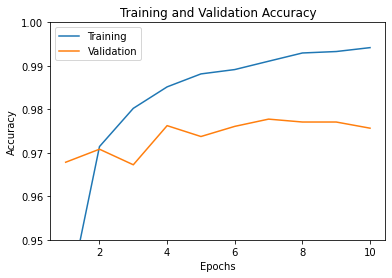

In [576]:
plt.plot(range(1, len(acctrain) + 1), history6.history['accuracy'], label = 'Training')
plt.plot(range(1, len(val_acctrain) + 1), history6.history['val_accuracy'], label = 'Validation')
plt.ylim([0.95, 1.0])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [577]:
loss6, accuracy6 = model6.evaluate(x_test_norm, y_test_encoded)
print('test set accuracy: ', accuracy6 * 100)

10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

test set accuracy:  97.64999747276306


In [578]:
trainloss6, trainaccuracy6 = model6.evaluate(x_train_norm, y_train_encoded)
print('train set accuracy: ', trainaccuracy6 * 100)

60000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

train set accuracy:  99.20166730880737


In [579]:
pred_classes = np.argmax(model6.predict(x_test_norm), axis=-1)
pred_classes

array([7, 2, 1, ..., 4, 5, 6])

In [580]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: id=3251591, shape=(10, 10), dtype=int32, numpy=
array([[ 968,    1,    0,    1,    2,    2,    3,    1,    1,    1],
       [   0, 1118,    2,    2,    0,    1,    3,    3,    5,    1],
       [   6,    0,  999,    4,    5,    0,    1,    9,    8,    0],
       [   0,    0,    2,  990,    0,    8,    0,    5,    4,    1],
       [   1,    0,    2,    0,  965,    0,    2,    1,    1,   10],
       [   2,    0,    0,    6,    1,  873,    3,    0,    3,    4],
       [   4,    2,    0,    0,   20,    3,  926,    0,    2,    1],
       [   0,    0,    5,    3,    4,    1,    0, 1005,    5,    5],
       [   3,    0,    3,    2,    5,    3,    3,    6,  945,    4],
       [   1,    1,    0,    4,   15,    2,    0,    6,    4,  976]], dtype=int32)>

In [581]:
Experiments = [1, 2, 3, 4, 5, 6]
training  = [trainaccuracy, trainaccuracy2, trainaccuracy3, trainaccuracy4, trainaccuracy5, trainaccuracy6]
times = [time1, time2, time3, time4, time5, time6]
Nodes = [128, 128, 64, 64, 256, 256]
Layers = [1, 2, 2, 1, 1, 2]
testaccuracy = [accuracy, accuracy2, accuracy3, accuracy4, accuracy5, accuracy6]
Results = pd.DataFrame({"Experiment": Experiments, "Processing Times": times, "Nodes Per Layer": Nodes, "Layers": Layers,  "Train Set Accuracy": training, "Test Set Accuracy": testaccuracy })
Results

,Experiment,Processing Times,Nodes Per Layer,Layers,Train Set Accuracy,Test Set Accuracy
0,1,88.251570,128,1,0.990050,0.9762
1,2,100.667954,128,2,0.993217,0.9791
2,3,86.110318,64,2,0.985783,0.9737
3,4,78.631330,64,1,0.985767,0.9726
4,5,120.206586,256,1,0.992700,0.9784
5,6,139.119087,256,2,0.992017,0.9765
